<a href="https://colab.research.google.com/github/diwu-kuleuven-tudelft/it-cert-automation-practice/blob/master/train_colab_FBG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [46]:
from google.colab import drive
drive.mount('/content/drive')

%cd /content/drive/MyDrive/Project/LSTM_modeling/dl-based-icrc

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Project/LSTM_modeling/dl-based-icrc


In [47]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [48]:
!pip install wandb==0.12.20
!pip install hydra-core
!pip install pytorch-lightning
!pip install torchtext
!pip install torchtyping
!pip install einops
# !pip install torchdiffeq

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [49]:
# Log in to your W&B account
import wandb
wandb.login()

True

In [50]:
%cd /content/drive/MyDrive/Project/LSTM_modeling/dl-based-icrc/Modeling/
!ls ..

/content/drive/MyDrive/Project/LSTM_modeling/dl-based-icrc/Modeling
checkpoints		    data_collection.gdoc  notebooks
Control			    data_collection.odt   README.md
Copy_of_train_colab1.ipynb  data_processing.html  train_colab_FBG.ipynb
data			    Modeling


In [51]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')
import hydra
import math
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from hydra import initialize, compose
from omegaconf import DictConfig
from datetime import datetime
import torch
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor, EarlyStopping
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from Modeling.datamodule.datamodule import APDataModule
from Modeling.tasks.RegressionTaskLSTM import RegressionTaskLSTM

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [52]:
with initialize(config_path="../Modeling/config"):
    config = compose(config_name="train.yaml")
    print(config)

np.random.seed(0)
torch.manual_seed(config.seed)
pl.seed_everything(config.seed)

time = datetime.now().strftime("%Y-%m-%d/%H-%M-%S")
wandb_logger = WandbLogger(project=config.project, group=config.group, name=time)

lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint_callback = ModelCheckpoint(
    monitor='Loss/val_normalized',
    save_top_k=1,
    dirpath='checkpoints/lstm/'+time,
    filename='sample-mnist-epoch{epoch:02d}-val_loss{val/loss:.2f}',
    #filename='sample',
    auto_insert_metric_name=False
)
callbacks = [lr_monitor, checkpoint_callback]
'''
if config.early_stopping is not None:
    monitor = {"monitor": "Val/total", "mode": "min"}
    stopper = EarlyStopping(
        patience=int(config.early_stopping),
        min_delta=0,
        strict=False,
        check_on_train_epoch_end=False,
        **monitor
    )
    callbacks.append(stopper)
'''
datamodule = APDataModule(config.datamodule, transform=None)

trainer = pl.Trainer(gpus=1,
                     max_epochs=config.num_epochs,
                     log_every_n_steps=config.log_freq,
                     logger=wandb_logger,
                     callbacks=[lr_monitor, checkpoint_callback]
                     )
task = RegressionTaskLSTM(config.model)
wandb.watch(task)
trainer.fit(task, datamodule, ckpt_path=config.ckpt_path)

wandb.finish()

<ipython-input-52-a783e74fa0dc>:1: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize(config_path="../Modeling/config"):
/usr/local/lib/python3.8/dist-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'train.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
INFO:lightning_lite.utilities.seed:Global seed set to 3047


{'datamodule': {'data_dir': '../data/FBG_modeling/processed', 'batch_size': 128, 'context_step': 20, 'target_step': 1, 'add_noise': False, 'std_pr': 0.0, 'std_po': 0.0, 'std_t': 0.0}, 'model': {'lstm': {'num_layers': 4, 'input_dim': 2, 'hidden_dim': 128, 'output_dim': 10}, 'lr': 0.001, 'lr_decay_steps': 10, 'lr_decay_rate': 0.9}, 'project': 'FBG_modeling_new', 'group': 'lstm', 'num_epochs': 300, 'log_freq': 5, 'seed': 3047, 'early_stopping': None, 'ckpt_path': None}


/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type       | Params
--------------------------------------------
0 | lstm         | LSTM       | 465 K 
1 | normalizer_p | Normalizer | 0     
2 | normalizer_o | Normalizer | 0     
--------------------------------------------
46

prepare ...
Number of train data:  38060
Number of valid data:  42752


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Loss/train,█▆▅▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Loss/train_normalized,█▄▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Loss/val,█▅▃▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▂▂▁▂▂▁▁▂▂▂▂▂▂▂▂▂▂▂▂▂
Loss/val_normalized,█▅▃▃▃▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▂▂▂▂▂▁▂▂▂▂▂▂▂▂▂▂▂▂▂▂
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
lr-Adam,██▇▇▆▆▅▅▅▅▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
Loss/train,0.0499
Loss/train_normalized,0.00015
Loss/val,0.75651
Loss/val_normalized,0.13176


In [ ]:
wandb.finish()

In [ ]:
with initialize(config_path="../Modeling/config"):
    config = compose(config_name="train.yaml")
    print(config)

config.seed = 1279247561
wandb.config = config
np.random.seed(0)
torch.manual_seed(config.seed)
pl.seed_everything(config.seed)

time = datetime.now().strftime("%Y-%m-%d/%H-%M-%S")
wandb_logger = WandbLogger(project=config.project, group=config.group, name=time)

lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint_callback = ModelCheckpoint(
    monitor='Val/total',
    save_top_k=1,
    dirpath='checkpoints/hmm/'+time,
    filename='best',
    auto_insert_metric_name=False
)
callbacks = [lr_monitor, checkpoint_callback]

if config.early_stopping is not None:
    monitor = {"monitor": "Val/total", "mode": "min"}
    stopper = EarlyStopping(
        patience=int(config.early_stopping),
        min_delta=0,
        strict=False,
        check_on_train_epoch_end=False,
        **monitor
    )
    callbacks.append(stopper)

datamodule = APDataModule(config.datamodule, transform=None)

trainer = pl.Trainer(gpus=1,
                     max_epochs=config.num_epochs,
                     log_every_n_steps=config.log_freq,
                     logger=wandb_logger,
                     callbacks=[lr_monitor, checkpoint_callback]
                     )
task = RegressionTaskHMM(config)
wandb.watch(task)
trainer.fit(task, datamodule, ckpt_path=config.ckpt_path)

wandb.finish()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'train.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
INFO:pytorch_lightning.utilities.seed:Global seed set to 1279247561


{'datamodule': {'data_dir': '../data/FBG_modeling/processed', 'batch_size': 256, 'context_step': 20, 'target_step': 1, 'add_noise': False, 'std_pr': 0.0, 'std_po': 0.0, 'std_t': 0.0}, 'model': {'lstm': {'num_layers': 4, 'input_dim': 2, 'hidden_dim': 128, 'output_dim': 10}, 'lr': 0.005, 'lr_decay_steps': 10, 'lr_decay_rate': 0.9}, 'project': 'FBG_modeling', 'group': 'lstm', 'num_epochs': 300, 'log_freq': 5, 'seed': 3047, 'early_stopping': None, 'ckpt_path': None}


/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:448: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  f"Setting `Trainer(gpus={gpus!r})` is deprecated in v1.7 and will be removed"
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


NameError: ignored

ODE

In [ ]:
with initialize(config_path="../Modeling/config"):
    config = compose(config_name="train.yaml")

datamodule = APDataModule(config.datamodule, transform=None)

trainer = pl.Trainer(gpus=1)
task = RegressionTaskODE(config)

# predict
res = trainer.predict(model=task,
                      dataloaders=datamodule,
                      ckpt_path="/content/drive/MyDrive/Yan/dl-based-icrc/Modeling/checkpoints/best-v27.ckpt",
                      return_predictions=True)

predictions = []
targets = []
errors = []

for r in res:
    predict = r['predict_position'].cpu().numpy()
    target = r['target_position'].cpu().numpy()
    predictions.append(predict)
    targets.append(target)
    error = np.mean((predict - target)**2)
    errors.append(error)


In [ ]:
predictions[0].shape

(1, 10, 2)

In [ ]:

# log table
# my_table = wandb.Table(columns=["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20"], rows=["MSE"], data=[errors])
# wandb.log({"Table": my_table})

# log plot
for i in range(len(predictions)):
    fig = plt.figure(figsize=(25, 5))
    plt.subplot(131)
    plt.plot(predictions[i][0, :, 0], label='predict_x')
    plt.plot(targets[i][0, :, 0], label='target_x')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(132)
    plt.plot(predictions[i][0, :, 1], label='predict_y')
    plt.plot(targets[i][0, :, 1], label='target_y')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(133)
    plt.plot(predictions[i][0, :, 0], predictions[i][0, :, 1], label='predict_xy')
    plt.plot(targets[i][0, :, 0], targets[i][0, :, 1], label='target_xy')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    # wandb.log({f'Plot/test_{i}': fig})

LSTM

<ipython-input-58-67ebeac04d8a>:1: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  with initialize(config_path="../Modeling/config"):
/usr/local/lib/python3.8/dist-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'train.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/trainer/connectors/accelerator_connector.py:441: LightningDeprecationWarning: Setting `Trainer(gpus=1)` is deprecated in v1.7 and will be removed in v2.0. Please use `Trainer(accelerator='gpu', devices=1)` instead.
  rank_zero_deprecation(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.ut

prepare ...
Number of test data:  22


Predicting: 0it [00:00, ?it/s]

<ipython-input-58-67ebeac04d8a>:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(30,5))
<ipython-input-58-67ebeac04d8a>:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(30,5))


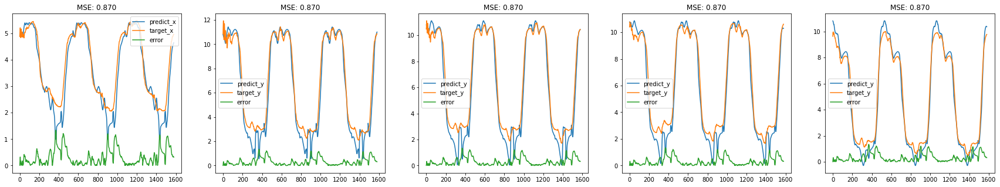

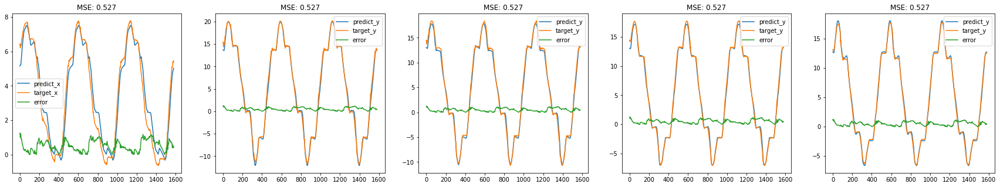

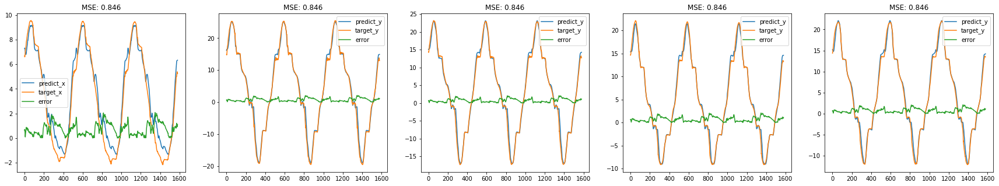

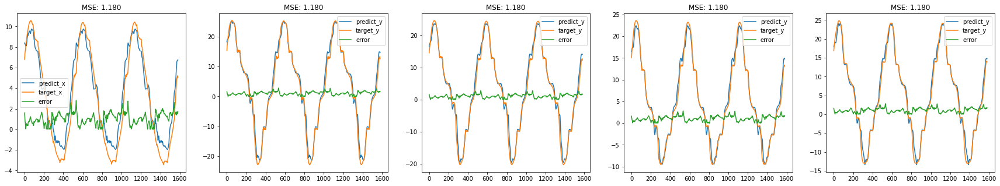

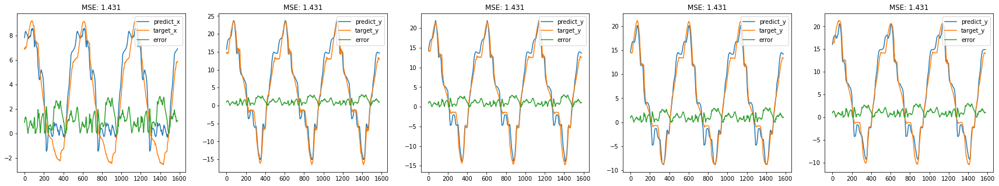

...

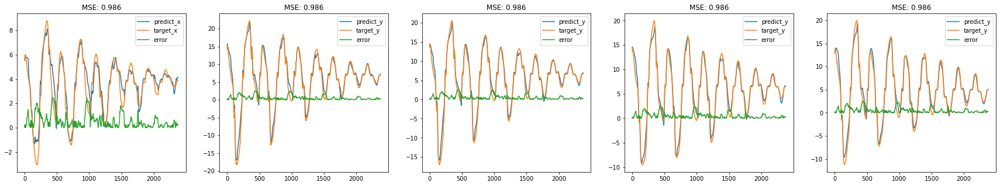

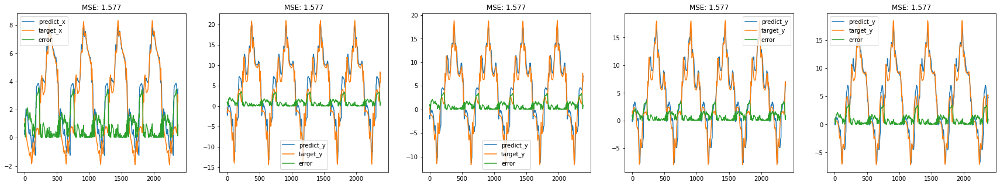

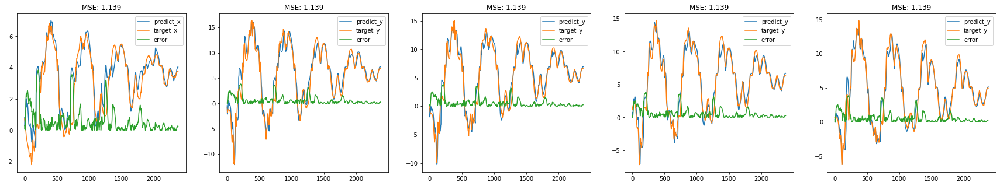

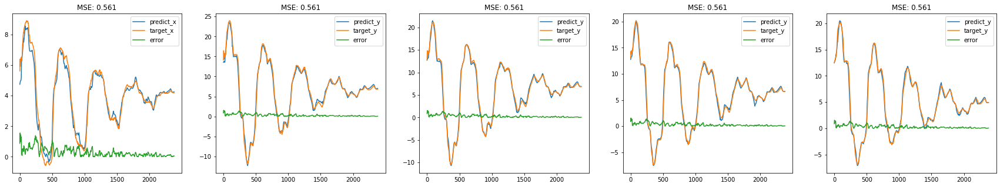

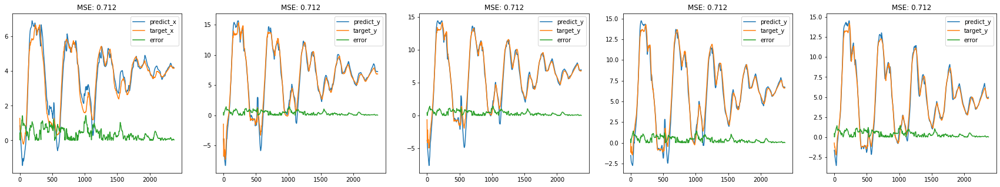

In [58]:
with initialize(config_path="../Modeling/config"):
    config = compose(config_name="train.yaml")
datamodule = APDataModule(config.datamodule, transform=None)

trainer = pl.Trainer(gpus=1)
task = RegressionTaskLSTM(config.model)
# predict
res = trainer.predict(model=task,
                      dataloaders=datamodule,
                      ckpt_path='/content/drive/MyDrive/Project/LSTM_modeling/dl-based-icrc/Modeling/checkpoints/lstm/2022-12-20/23-53-37/sample-mnist-epoch146-val_loss0.00.ckpt',
                      return_predictions=True)

predictions = []
targets = []
errors = []

for r in res:
    predict, target = r
    predictions.append(predict)
    targets.append(target)
    error = np.sqrt(np.mean((predict - target)**2))
    errors.append(error)

# log table
# my_table = wandb.Table(columns=["1", "2", "3", "4", "5", "6", "7", "8", "9", "10"], rows=["MSE"], data=[errors])
# wandb.log({"Table": my_table})

# wandb.Table(columns=["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20"], rows=["MSE"], data=[position_errors])
# wandb.log({"Table_Position": table_position})

# log plot
k = 0
for i in range(len(predictions)):
    fig = plt.figure(figsize=(30,5))
    plt.subplot(151)
    plt.plot(predictions[i][:, k], label='predict_x')
    plt.plot(targets[i][:, k], label='target_x')
    plt.plot(abs(predictions[i][:, k]-targets[i][:, k]), label='error')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(152)
    plt.plot(predictions[i][:, k+1], label='predict_y')
    plt.plot(targets[i][:, k+1], label='target_y')
    plt.plot(abs(predictions[i][:, k]-targets[i][:, k]), label='error')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(153)
    plt.plot(predictions[i][:, k+2], label='predict_y')
    plt.plot(targets[i][:, k+2], label='target_y')
    plt.plot(abs(predictions[i][:, k]-targets[i][:, k]), label='error')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(154)
    plt.plot(predictions[i][:, k+3], label='predict_y')
    plt.plot(targets[i][:, k+3], label='target_y')
    plt.plot(abs(predictions[i][:, k]-targets[i][:, k]), label='error')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.subplot(155)
    plt.plot(predictions[i][:, k+4], label='predict_y')
    plt.plot(targets[i][:, k+4], label='target_y')
    plt.plot(abs(predictions[i][:, k]-targets[i][:, k]), label='error')
    plt.title('MSE: %.3f' % errors[i])
    plt.legend()

    plt.savefig('curvature_x.pdf')  

    #wandb.log({f'Plot/test_{i}': fig})

HMM

In [ ]:

with initialize(config_path="../Modeling/config"):
    config = compose(config_name="train.yaml")

wandb.init(project=config.project, id="1q2bi60d")

datamodule = APDataModule(config.datamodule, transform=None)

trainer = pl.Trainer(gpus=1)
task = RegressionTaskHMM(config)

# predict
res = trainer.predict(model=task,
                      dataloaders=datamodule,
                      ckpt_path='/content/drive/MyDrive/projects/dl-based-icrc/Modeling/checkpoints/hmm/2022-06-17/19-09-24/best.ckpt',
                      return_predictions=True)

position_predictions = []
position_targets = []
pressure_predictions = []
pressure_targets = []
state_predictions = []
state_targets = []

position_errors = []
pressure_errors = []
state_errors = []

for r in res:
    position_predict = r['predict_position']
    position_target = r['target_position']
    pressure_predict = r['predict_pressure']
    pressure_target = r['target_pressure']
    state_predict = r['predict_states']
    state_target = r['target_states']

    position_predictions.append(position_predict)
    position_targets.append(position_target)
    pressure_predictions.append(pressure_predict)
    pressure_targets.append(pressure_target)
    state_predictions.append(state_predict)
    state_targets.append(state_target)

    position_error = np.sqrt(np.mean((position_predict - position_target)**2))
    pressure_error = np.sqrt(np.mean((pressure_predict - pressure_target)**2))
    state_error = np.mean((state_predict - state_target)**2)
    
    position_errors.append(position_error)
    pressure_errors.append(pressure_error)
    state_errors.append(state_error)

pressure_errors = np.array(pressure_errors)
position_errors = np.array(position_errors)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning:


The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1

/usr/local/lib/python3.7/dist-packages/hydra/_internal/defaults_list.py:251: UserWarning:

In 'train.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/upgrades/1.0_to_1.1/default_composition_order for more information



/usr/local/lib/python3.7/dist-packages/pytorch_lightning/loops/utilities.py:94: PossibleUserWarning:

`max_epochs` was not set. Setting it to 1000 epochs. To train without an epoch limit, set `max_epochs=-1`.

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


prepare ...


Restoring states from the checkpoint path at /content/drive/MyDrive/projects/dl-based-icrc/Modeling/checkpoints/hmm/2022-06-17/19-09-24/best.ckpt
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Loaded model weights from checkpoint at /content/drive/MyDrive/projects/dl-based-icrc/Modeling/checkpoints/hmm/2022-06-17/19-09-24/best.ckpt


Number of test data:  32


Predicting: 0it [00:00, ?it/s]

In [ ]:
wandb.init(project=config.project, id="1q2bi60d")
pressure_rmse = np.mean(pressure_errors)
position_rmse = np.mean(position_errors)

wandb.log({'rmse/pressure': pressure_rmse,
           'rmse/position': position_rmse})


plt.plot(pressure_errors, label='pressure_rmse')
plt.plot(position_errors, label='position_rmse')

wandb.log({'Plot': plt})
wandb.finish()

rmse/position,▁
rmse/pressure,▁
rmse/position,1.00341
rmse/pressure,0.14456


In [ ]:
wandb.init(project=config.project, id="2cvxr8ag")
# log table
table_position = wandb.Table(columns=["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "24"], rows=["MSE"], data=[position_errors])
wandb.log({"Table_Position": table_position})

table_pressure = wandb.Table(columns=["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "24"], rows=["MSE"], data=[pressure_errors])
wandb.log({"Table_Pressure": table_pressure})

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning

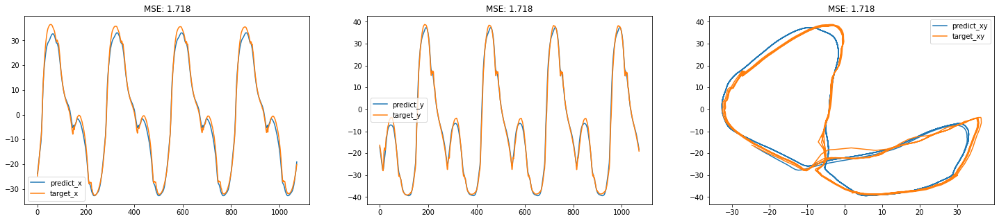

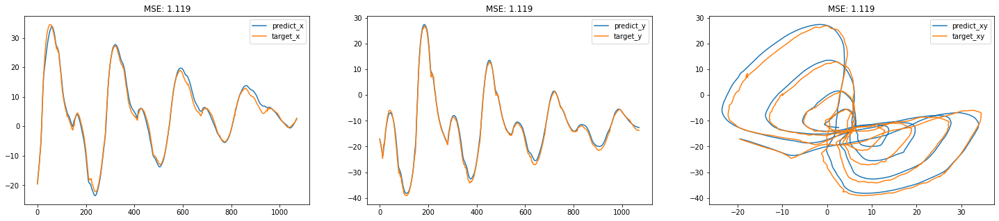

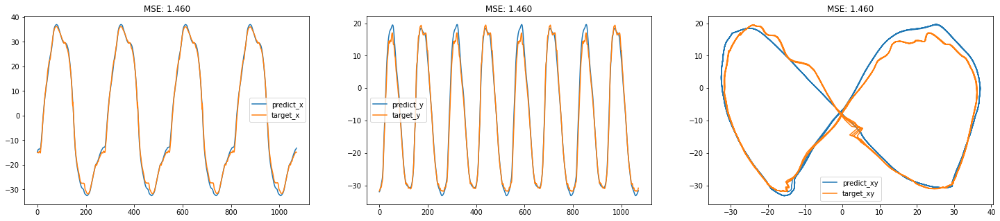

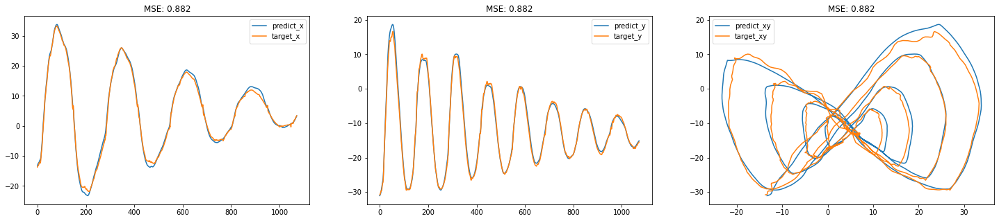

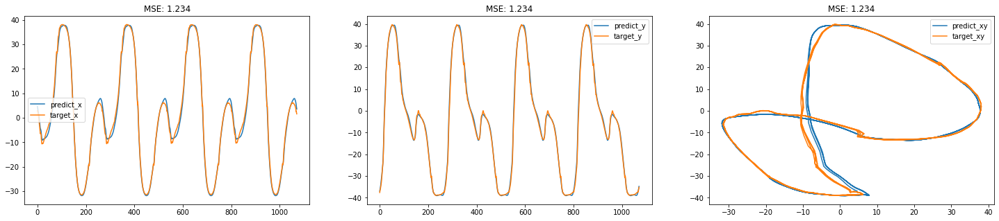

...

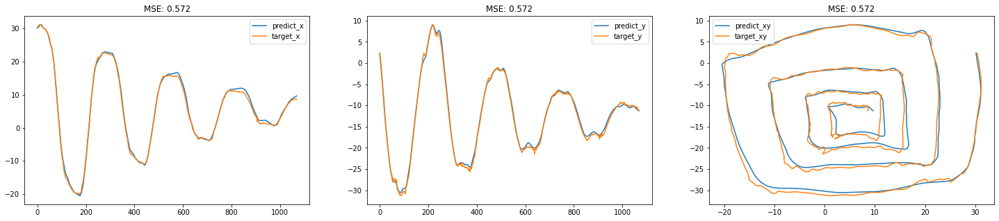

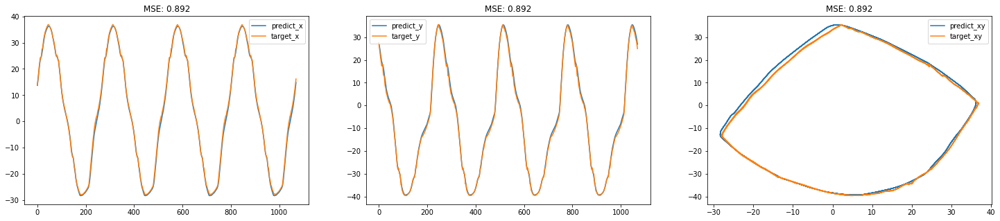

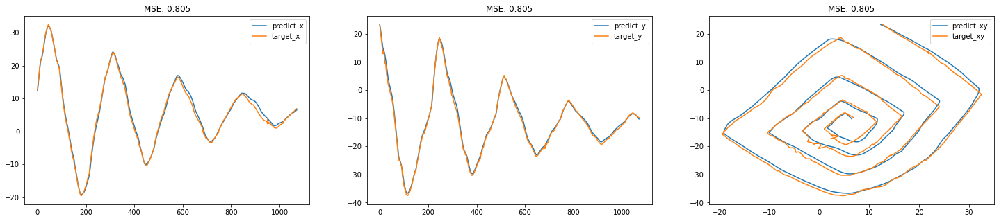

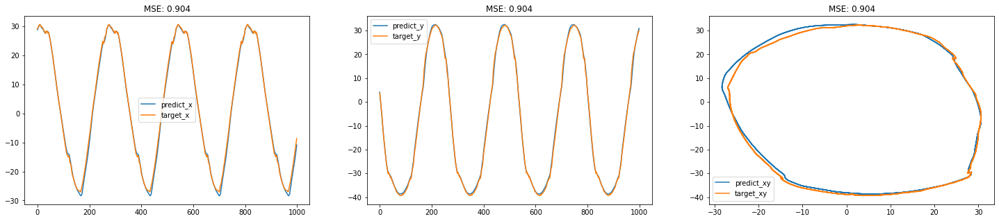

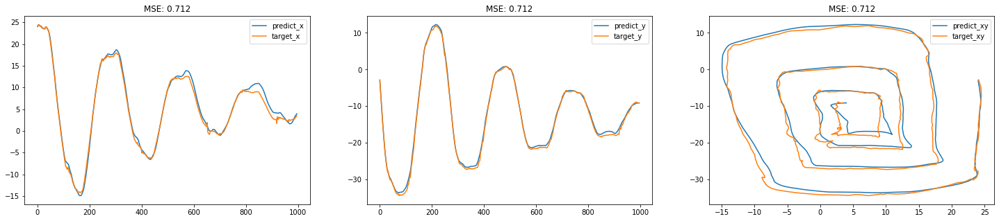

In [ ]:
# log plot
for i in range(len(position_predictions)):
    fig = plt.figure(figsize=(25, 5))
    plt.subplot(131)
    plt.plot(position_predictions[i][0, :, 0], label='predict_x')
    plt.plot(position_targets[i][0, :, 0], label='target_x')
    plt.title('RMSE: %.3f' % position_errors[i])
    plt.legend()

    plt.subplot(132)
    plt.plot(position_predictions[i][0, :, 1], label='predict_y')
    plt.plot(position_targets[i][0, :, 1], label='target_y')
    plt.title('RMSE: %.3f' % position_errors[i])
    plt.legend()

    plt.subplot(133)
    plt.plot(position_predictions[i][0, :, 0], position_predictions[i][0, :, 1], label='predict_xy')
    plt.plot(position_targets[i][0, :, 0], position_targets[i][0, :, 1], label='target_xy')
    plt.title('RMSE: %.3f' % position_errors[i])
    plt.legend()

    # wandb.log({f'Position_Plot/test_{i}': fig})



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning

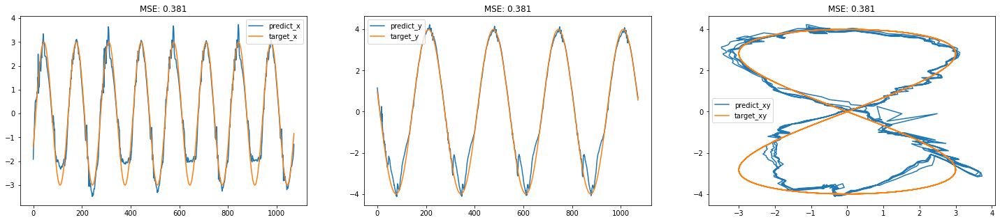

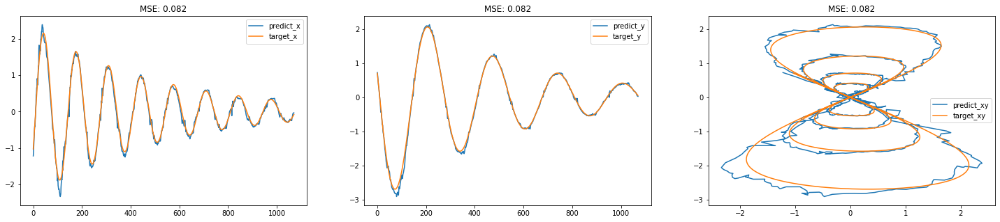

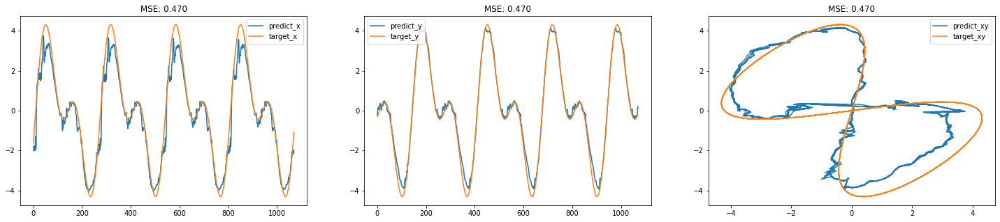

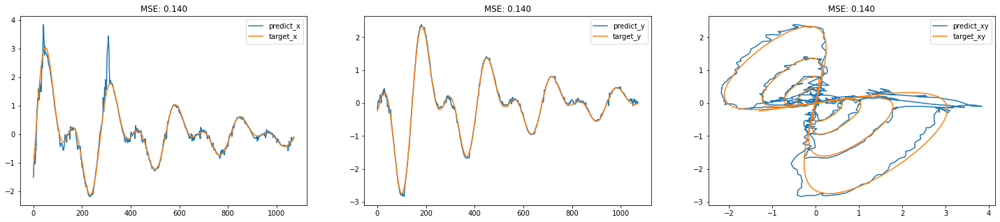

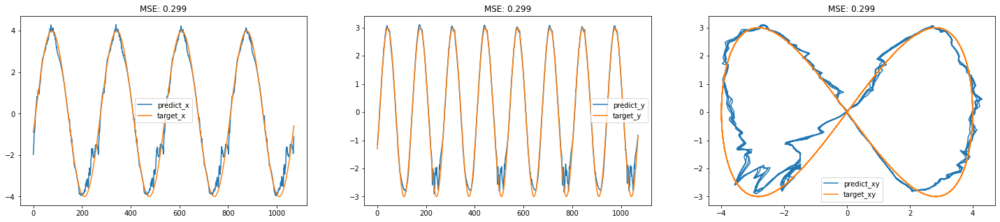

...

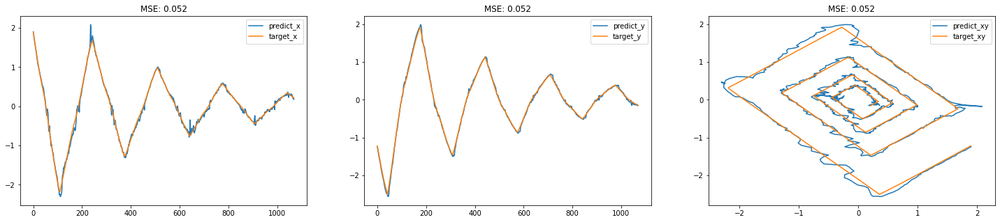

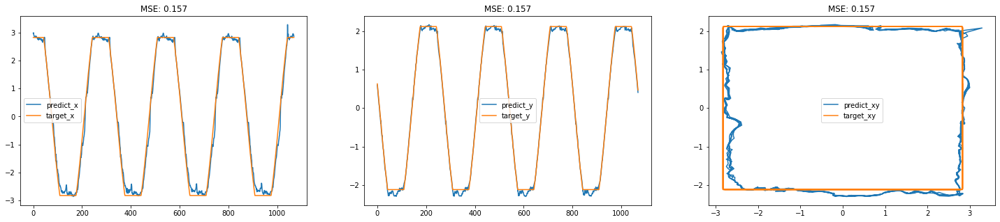

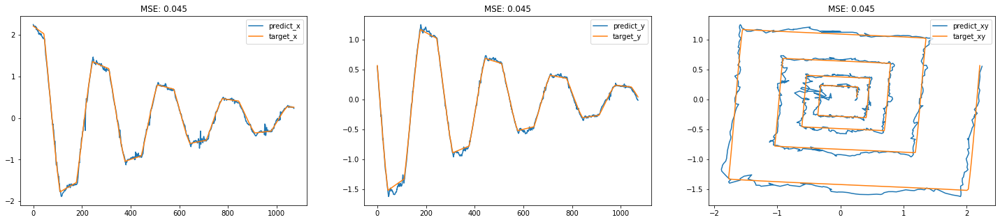

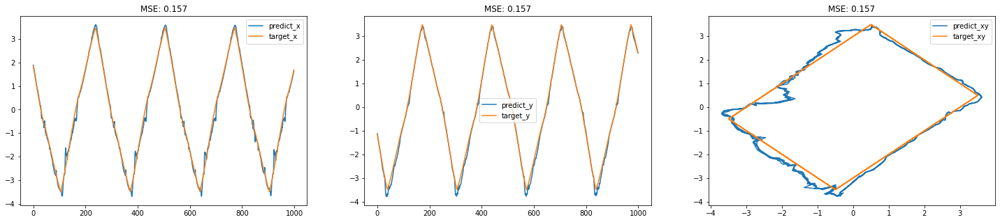

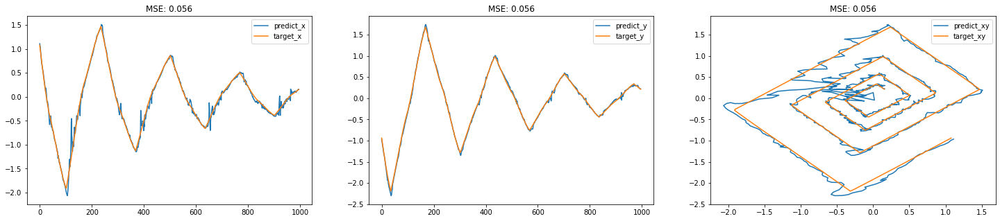

In [ ]:
for i in range(len(pressure_predictions)):
    fig = plt.figure(figsize=(25, 5))
    plt.subplot(131)
    plt.plot(pressure_predictions[i][0, :, 0], label='predict_x')
    plt.plot(pressure_targets[i][0, :, 0], label='target_x')
    plt.title('RMSE: %.3f' % pressure_errors[i])
    plt.legend()

    plt.subplot(132)
    plt.plot(pressure_predictions[i][0, :, 1], label='predict_y')
    plt.plot(pressure_targets[i][0, :, 1], label='target_y')
    plt.title('RMSE: %.3f' % pressure_errors[i])
    plt.legend()

    plt.subplot(133)
    plt.plot(pressure_predictions[i][0, :, 0], pressure_predictions[i][0, :, 1], label='predict_xy')
    plt.plot(pressure_targets[i][0, :, 0], pressure_targets[i][0, :, 1], label='target_xy')
    plt.title('RMSE: %.3f' % pressure_errors[i])
    plt.legend()

    # wandb.log({f'Pressure_Plot/test_{i}': fig})

In [ ]:
wandb.finish()